# ДЗ-2

Кириллов, ИУ5-22М

я переделал все папки. Пути очень важны в этой лабе.
- ./yolov7/ - проект YOLO с гитхаб + файлик с предобученными весами yolov.pt
- ./dataset/ - мой разархивированный датасет, полученный из программы CVAT
- ./data/ - копия датасета, которая потом портится той ячейкой, которая разбивает его на 3 папки

# **1. Установка зависимостей**

# 1.2 Установка зависимостей

Загрузил 2 файла - датасет и `loss.py`. **Далее пути указаны для версии в kaggle**. Предварительно я создал датасет в отдельной гуишке kaggle, загрузил туда zip-архив, полученный из программы CVAT, подключил его в этом ноутбуке в панели справа

`/kaggle/input/` - kaggle датасеты, подключенные к ноутбуку
`/kaggle/working/` - текущая директория, контекст выполнения ноутбука

Датасет содержит следующие файлы и директории:
```
/kaggle/input/10-annotated/obj_train_data/*
/kaggle/input/10-annotated/obj.data
/kaggle/input/10-annotated/obj.names
/kaggle/input/10-annotated/train.txt
```

Исправленный `loss.py` с измененными строками 685 и 756 файл (`./yolov7/utils/loss.py`)
```
/kaggle/input/loss-py/loss.py
```

В ячейке ниже скачиваем предобученные веса `yolov7.pt`, скачиваем модель и утилиту для обучения yolov7 с гитхаба и устанавливаем нужные версии библиотек.

Папка, куда скачается YOLO из гитхаба
```
./yolov7 или /kaggle/working/yolov7
```
После скачивания YOLO нужно замнить `./yolov7/utils/loss.py` на исправленный

In [2]:
# Просмотр файлов датасета
# Ниже перед созданием датасета тоже надо поменять путь к исходному датасету.

# kaggle
!ls -lah /kaggle/input/100-plus-10-annotated
!ls -lah /kaggle/input/loss-py

# colab
# %%bash
# mkdir dataset
# unzip -q "./100_plus_10_annotated.zip" -d dataset
# tar -xf "./100_plus_10_annotated.tar" -C ./dataset
# mv ./dataset/100_plus_10_annotated/* ./dataset
# rm -r ./dataset/100_plus_10_annotated
# ls -lah ./dataset
# ls -lah ./loss.py

total 28K
drwxr-xr-x 3 nobody nogroup    0 May 27 09:05 .
drwxr-xr-x 5 root   root    4.0K May 27 14:38 ..
-rw-r--r-- 1 nobody nogroup   75 May 27 09:05 obj.data
-rw-r--r-- 1 nobody nogroup   20 May 27 09:05 obj.names
drwxr-xr-x 2 nobody nogroup    0 May 27 09:05 obj_train_data
-rw-r--r-- 1 nobody nogroup  16K May 27 09:05 train.txt
total 80K
drwxr-xr-x 2 nobody nogroup    0 May 26 11:54 .
drwxr-xr-x 5 root   root    4.0K May 27 14:38 ..
-rw-r--r-- 1 nobody nogroup  74K May 26 11:54 loss.py


In [26]:
# Скачивание репозитория YOLOv7 и установка нужных библиотек

!git clone https://github.com/augmentedstartups/yolov7.git
!wget -O yolov7/yolov7.pt --quiet https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt # Очень важно скачать yolov7.pt именно в yolov7/
# tiny - "легкая версия", ONNX весит 20 Мб вместо 140 Мб.
# !wget -O yolov7/yolov7-tiny.pt --quiet https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-tiny.pt

    
!cd yolov7
!pip install -r requirements.txt
!pip install numpy==1.23.5
!cd ..

# Исправленный loss.py: Измененные строки 685 и 756 в файле yolov7/utils/loss.py
# kaggle
!cp /kaggle/input/loss-py/loss.py ./yolov7/utils/loss.py
# colab
# !cp ./loss.py ./yolov7/utils/loss.py

!pip install onnx
!pip install onnxsim

In [27]:
# Проблемные библиотеки. Просмотр версий

!pip freeze | grep torch # 2.3.0 - норм
!pip freeze | grep wandb # не нужен вообще. Только каккл ругается
!pip freeze | grep onnx  # 1.16.1 - норм

pytorch-ignite==0.5.0.post2
pytorch-lightning==2.2.2
torch @ file:///tmp/torch/torch-2.1.2-cp310-cp310-linux_x86_64.whl#sha256=ae3259980b8d6551608b32fde2695baca64c72ed15ab2332023a248c113815a8
torchaudio @ file:///tmp/torch/torchaudio-2.1.2-cp310-cp310-linux_x86_64.whl#sha256=10966b20361b49bc41b6c6ba842d3ea842320fb8c589823b4120f24a98013b4a
torchdata==0.7.1
torchinfo==1.8.0
torchmetrics==1.3.2
torchtext @ file:///tmp/torch/torchtext-0.16.2-cp310-cp310-linux_x86_64.whl#sha256=a2a382655a08e1f6eeab6a307d0c8d78139cfa04cc329a7dc15a3f7c1e6e7a19
torchvision @ file:///tmp/torch/torchvision-0.16.2-cp310-cp310-linux_x86_64.whl#sha256=105901a20924f652ee62df0bb57580c67725eb21f11a349658952c4be2050d94
wandb==0.16.6
onnx==1.16.0
onnxruntime==1.18.0
onnxsim==0.4.36


In [28]:
import torch
import os
import shutil
import yaml
from sklearn.model_selection import train_test_split
from IPython.display import Image
import matplotlib.pyplot as plt
import math
from datetime import datetime

%matplotlib inline

# **2. Импорт датасета**

In [29]:
dataset_path = './data/obj_train_data' # Укажите свой путь до папки obj_train_data датасета
yolo_path = './yolov7' # Папка, куда скачался проект yolo из гитзаба

# Путь к файлу obj.names относительно dataset_path
# У меня файл лежал не в dataset_path, как у Канева, а на уровень ниже
# obj_names_path = 'obj.names'
obj_names_path = '../obj.names'

test_size = 0.2 # размер тестовой выборки
valid_size = 0.1 # размер валидационной выборки

Разобьем датасет на тестовую и обучающую выборки

**Этот код ломает исходный датасет, перемещая файлы по папкам**. Поэтому я заново копирую датасет в другую папку. Тем более что в /kaggle/input нельзя записывать файлы

In [30]:
!rm -r data
!mkdir data

# kaggle
!cp -r /kaggle/input/100-plus-10-annotated/* ./data
# colab
# !cp -r ./dataset/* ./data

In [31]:
image_files = [f for f in os.listdir(dataset_path) if f.endswith('.jpg')]
annotation_files = [f for f in os.listdir(dataset_path) if f.endswith('.txt')]

image_files_with_annotations = [f for f in image_files if f.replace('.jpg', '.txt') in annotation_files]

print('До:', {
    "image_files": len(image_files),
    "annotation_files": len(annotation_files),
    "image_files_with_annotations": len(image_files_with_annotations),
})

train_files, test_files = train_test_split(image_files_with_annotations, test_size=test_size, random_state=42)
train_files, valid_files = train_test_split(train_files, test_size=len(image_files_with_annotations)*valid_size/len(train_files), random_state=42)

def copy_files(files, source_path, dest_path):
    for file in files:
        shutil.copy(os.path.join(source_path, file), os.path.join(dest_path, 'images'))
        shutil.copy(os.path.join(source_path, file.replace('.jpg', '.txt')), os.path.join(dest_path, 'labels'))

for folder in ['train', 'valid', 'test']:
    os.makedirs(os.path.join(dataset_path, folder, 'images'), exist_ok=True)
    os.makedirs(os.path.join(dataset_path, folder, 'labels'), exist_ok=True)

copy_files(train_files, dataset_path, os.path.join(dataset_path, 'train'))
copy_files(valid_files, dataset_path, os.path.join(dataset_path, 'valid'))
copy_files(test_files, dataset_path, os.path.join(dataset_path, 'test'))

print('После:', {
    "train.labels": len(os.listdir(os.path.join(dataset_path, 'train/labels'))),
    "train.images": len(os.listdir(os.path.join(dataset_path, 'train/images'))),
    "valid.labels": len(os.listdir(os.path.join(dataset_path, 'valid/labels'))),
    "valid.images": len(os.listdir(os.path.join(dataset_path, 'valid/images'))),
    "test.labels": len(os.listdir(os.path.join(dataset_path, 'test/labels'))),
    "test.images": len(os.listdir(os.path.join(dataset_path, 'test/images'))),
})

for file in os.listdir(dataset_path):
    if not file.endswith('.names') and os.path.isfile(os.path.join(dataset_path, file)):
      os.remove(os.path.join(dataset_path, file))



# Создание и подключение конфига к YOLO

train_path = os.path.join(dataset_path, 'train/images')
val_path = os.path.join(dataset_path, 'valid/images')
test_path = os.path.join(dataset_path, 'test/images')

names_file = os.path.join(dataset_path, obj_names_path)
with open(names_file, 'r') as file:
    class_names = [line.strip() for line in file.readlines()]

num_classes = len(class_names)

data = {
    'train': train_path,
    'val': val_path,
    'test': test_path,
    'nc': num_classes,
    'names': class_names
}

output_file = os.path.join(dataset_path, 'data.yaml')
with open(output_file, 'w') as file:
    documents = yaml.dump(data, file)

os.remove(os.path.join(dataset_path, obj_names_path))



# Проверка, что файл data.yaml создался
try:
    os.listdir(os.path.join(dataset_path)).index('data.yaml')
    print('Файл data.yaml создался')
except Exception as e:
    print(e)

До: {'image_files': 330, 'annotation_files': 330, 'image_files_with_annotations': 330}
После: {'train.labels': 231, 'train.images': 231, 'valid.labels': 33, 'valid.images': 33, 'test.labels': 66, 'test.images': 66}
Файл data.yaml создался


# **3. Запуск обучения**

# 3.1 Архитектура сети


In [9]:
# Это все разные вариации архитектуры под разные задачи
# %%bash
# wget -P /content/gdrive/MyDrive/yolov7 https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt
# wget -P /content/gdrive/MyDrive/yolov7 https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7x.pt
# wget -P /content/gdrive/MyDrive/yolov7 https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-w6.pt
# wget -P /content/gdrive/MyDrive/yolov7 https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-e6.pt
# wget -P /content/gdrive/MyDrive/yolov7 https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-d6.pt
# wget -P /content/gdrive/MyDrive/yolov7 https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-e6e.pt

Загрузка предобученных весов модели. Проверка, что веса загружаются корректно.

Если веса не загрузились, вы это сразу поймете по миллиарду разнообразных ошибок, никакая из которых не укажет на причину. ПРОИЗОШЕЛ PYTHON MOMENT

**Очень важен контекст выполнения**!

Даун `torch.load` не сможет загрузить веса, если вызывать **не из `yolo_path`**

In [33]:
%cd yolov7
weights = torch.load('yolov7.pt')
# weights = torch.load('yolov7-tiny.pt')
print(weights)
%cd ..

/kaggle/working/yolov7
{'model': Model(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (2): Conv(
      (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (3): Conv(
      (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_r

# 3.2 Начало обучения

[Чтобы получить полный список аргументов обучения, перейдите по ссылке](https://github.com/WongKinYiu/yolov7/blob/main/train.py)

Несколько важных аргументов, которые следует знать
- **configuration**: в основной папке yolov7 перейдите в папку cfg/training и выберите путь к соответствующему файлу конфигурации. Укажите относительный путь к файлу в аргументе **--cfg**.
- **data** путь к папке с данными, она будет обработана автоматически
- **weights** путь к предварительно обученным весам, заданный аргументом **--weights**


<br><br>

**Примечание по возобновлению обучения с контрольной точки** <br>
По умолчанию контрольные точки для эпохи хранятся в папке yolov7/runs/train, укажите относительный путь к контрольным точкам последней эпохи.

In [49]:
EPOCHS = 55 # По умолчанию
BS = 16 # По умолчанию

EPOCHS = 55 * 2
BS = 16 // 2

In [40]:
# Если wandb ждет ввод с клавиатуры, чтобы узнать, куда ему логгировать, просит указать аккаунт, то установите переменную среды WANDB_DISABLED = 'true'
# В kaggle просит, в colab - не просит
os.environ['WANDB_DISABLED'] = 'true'

**Очень важен контекст выполнения**!

In [50]:
%%time

# Очень важен контекст выполнения. Очень важно правильно задать пути
# - к скрипту train.py
# - к конфигу {yolo_path}/cfg/training/yolov7.yaml, например, yolov7/cfg/training/yolov7.yaml
# - к датасету {dataset_path}/data.yaml, например, ./data/obj_train_data/data.yaml
# - к предобученным весам {yolo_path}/yolov7.pt, например, yolov7/yolov7.pt

!python {yolo_path}/train.py --batch {BS} --cfg {yolo_path}/cfg/training/yolov7.yaml --epochs {EPOCHS} --data {dataset_path}/data.yaml --weights {yolo_path}/yolov7.pt --device 0
# tiny-версия
# !python {yolo_path}/train.py --batch {BS} --cfg {yolo_path}/cfg/training/yolov7-tiny.yaml --epochs {EPOCHS} --data {dataset_path}/data.yaml --weights {yolo_path}/yolov7-tiny.pt --device 0

2024-05-27 15:12:50.760410: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-27 15:12:50.760476: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-27 15:12:50.762174: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: WARNING `resume` will be ignored since W&B syncing is set to `offline`. Starting a new run with run id oar792h7.
wandb: Tracking run with wandb version 0.16.6
wandb: W&B syncing is set to `offline` in this directory.  
wandb: Run `wandb online` or set WANDB_MODE=online to enable cloud syncing.
train: Scanning 'data/obj_train_data/train/labels.cache' images

# **4. Оценка**

- Обратите внимание, что контрольные точки тренировки по умолчанию сохраняются в файле run/train/exp. Пройдите путь к последней контрольной точке.

Мы можем оценить эффективность нашего индивидуального обучения, используя предоставленный сценарий оценки.

Обратите внимание, что мы можем настроить приведенные ниже пользовательские аргументы. Подробности см. в [аргументах, принимаемых detect.py](https://github.com/WongKinYiu/yolov7/blob/main/detect.py#L154).

# 4.1 F1 и Precision Recall кривые

In [42]:
# 22 файла, 1 папка с весами. Из файлов 18 штук - картинки
result_images_folder = './runs/train/exp'

statistics_images = [f for f in os.listdir(result_images_folder) if f.endswith('.png') ]
example_images = [f for f in os.listdir(result_images_folder) if f.endswith('.jpg')]

print({
    'len statistics_images': str(len(statistics_images)) + ' (должно быть 6)',
    'len example_images': len(example_images),
})

{'len statistics_images': '6 (должно быть 6)', 'len example_images': 14}


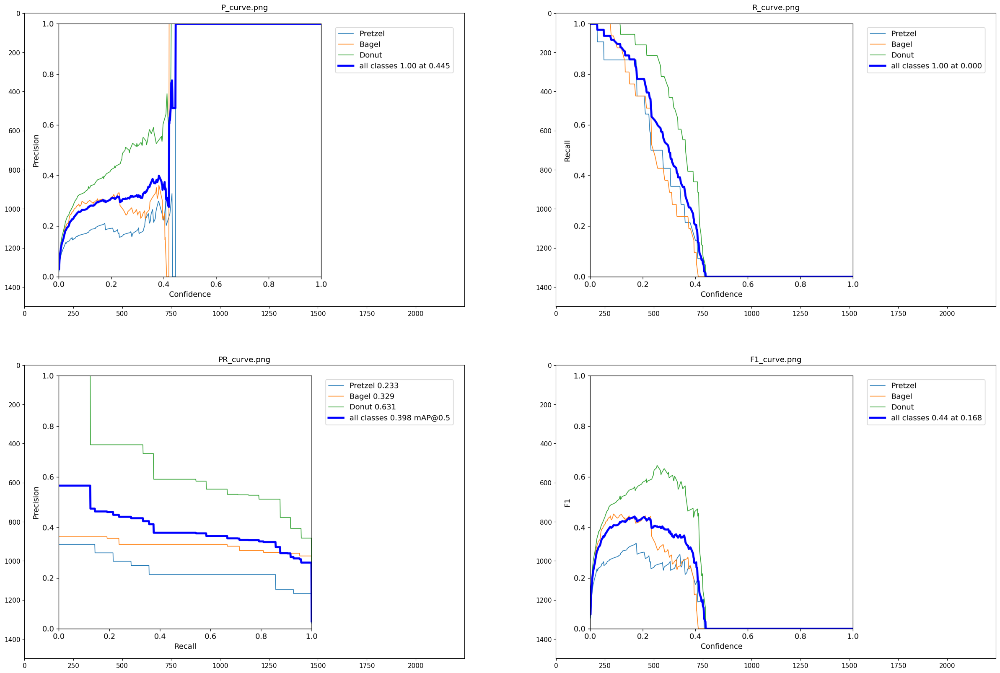

In [43]:
%matplotlib inline

fig, axes = plt.subplots(2, 2, figsize=(30,20))
for idx, f in enumerate(['P_curve.png', 'R_curve.png', 'PR_curve.png', 'F1_curve.png']):
    img_path = os.path.join(result_images_folder, f)
    image = plt.imread(img_path)
    axes[idx // 2, idx % 2].imshow(image)
    axes[idx // 2, idx % 2].set_title(f)

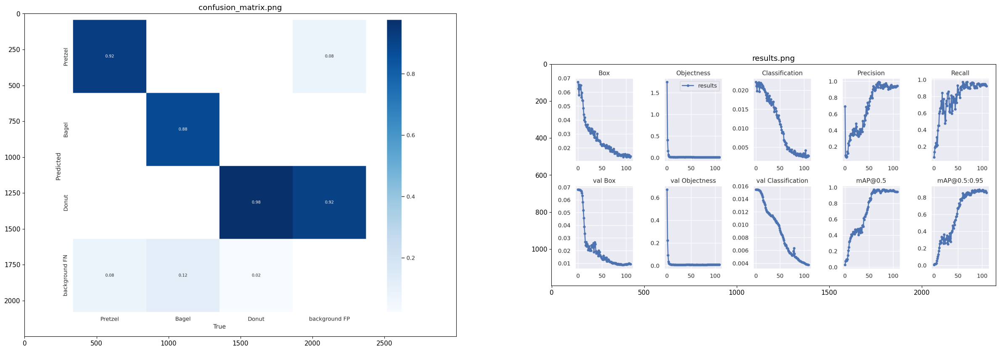

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(30,10))
for idx, f in enumerate(['confusion_matrix.png', 'results.png']):
    img_path = os.path.join(result_images_folder, f)
    image = plt.imread(img_path)
    axes[idx].imshow(image)
    axes[idx].set_title(f)

16


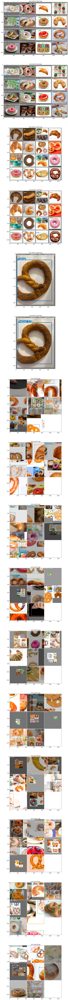

In [19]:
print(len(example_images))
fig, axes = plt.subplots(nrows=math.ceil(len(example_images) / 1), figsize=(60,200))
plt.plot()
for idx, f in enumerate(sorted(example_images)):
    img_path = os.path.join(result_images_folder, f)
    image = plt.imread(img_path)
    axes[idx].imshow(image)
    axes[idx].set_title(f)

# **4. Экспорт модели в onnx**

In [46]:
!python {yolo_path}/export.py --weights {result_images_folder}/weights/best.pt \
        --grid --end2end --simplify \
        --topk-all 100 --iou-thres 0.45 --conf-thres 0.25 \
        --img-size 640 640 --max-wh 640

Import onnx_graphsurgeon failure: No module named 'onnx_graphsurgeon'
Namespace(weights='./runs/train/exp/weights/best.pt', img_size=[640, 640], batch_size=1, dynamic=False, dynamic_batch=False, grid=True, end2end=True, max_wh=640, topk_all=100, iou_thres=0.45, conf_thres=0.25, device='cpu', simplify=True, include_nms=False, fp16=False, int8=False)
Fusing layers... 
IDetect.fuse
/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

Starting TorchScript export with torch 2.1.2...
/kaggle/working/yolov7/models/yolo.py:150: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the f

В папке yolov7/runs/train/exp/weights/ должен был появиться файл best.onnx

## Экспорт весов .pt и графиков в директорию ./models

После выполнения скачайте архивы из папки `./models`

In [44]:
MODEL_NAME = datetime.now().strftime("%d.%m-%H:%M:%S")
MODEL_NAME

'27.05-15:00:56'

In [47]:
!mkdir ./models
# У обычной YOLO v7 вес - 140 Мб, у tiny - 23 Мб
!mv {result_images_folder}/weights/best.onnx models/{MODEL_NAME}.onnx

mkdir: cannot create directory 'models': File exists


In [48]:
# Выгрузка
# Картинки со статистиками - 4 Мб
!tar --exclude {result_images_folder}/weights -cvf models/{MODEL_NAME}-stats.tar {result_images_folder}
# Только best.pt веса - 135М
!tar -cvf ./models/{MODEL_NAME}-weights.tar {result_images_folder}/weights/best*
!ls -lah ./models | grep {MODEL_NAME}

./runs/train/exp/
./runs/train/exp/train_batch6.jpg
./runs/train/exp/P_curve.png
./runs/train/exp/train_batch3.jpg
./runs/train/exp/train_batch9.jpg
./runs/train/exp/train_batch4.jpg
./runs/train/exp/PR_curve.png
./runs/train/exp/train_batch8.jpg
./runs/train/exp/train_batch1.jpg
./runs/train/exp/test_batch1_labels.jpg
./runs/train/exp/events.out.tfevents.1716821278.c0cc66c73020.512.0
./runs/train/exp/confusion_matrix.png
./runs/train/exp/F1_curve.png
./runs/train/exp/train_batch5.jpg
./runs/train/exp/R_curve.png
./runs/train/exp/test_batch0_labels.jpg
./runs/train/exp/train_batch7.jpg
./runs/train/exp/train_batch0.jpg
./runs/train/exp/hyp.yaml
./runs/train/exp/test_batch0_pred.jpg
./runs/train/exp/train_batch2.jpg
./runs/train/exp/opt.yaml
./runs/train/exp/results.txt
./runs/train/exp/results.png
./runs/train/exp/test_batch1_pred.jpg
./runs/train/exp/weights/best.pt
./runs/train/exp/weights/best.torchscript.pt
./runs/train/exp/weights/best.torchscript.ptl
-rw-r--r-- 1 root root 4.0M M